# Aim of the notebook

In this notebook we identify the optimal expansion for each cell type on each domain. For this, we use the annotated adata form the 3 mouse brain coronal sections, using the sections that has domain annotation. 

# Import packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import cKDTree
import random as rd
from tqdm import tqdm
from xb.calculating import dist_nuc,hex_to_rgb,distance_calc
import matplotlib

# Read data

In [4]:
# get reads original
adata1=sc.read('../../data/unprocessed_adata/ms_brain_multisection1.h5ad')
reads_original=adata1.uns['spots']
adata=sc.read('../../data/processed_adata/adata_multisection_nuclei_r1_with_annotations.h5ad')
adata1=adata[adata.obs['replicate']=='1']

In [7]:
adata1.obs['initial_annotation']=adata1.obs['Class']
id_cluster=dict(zip(adata1.obs['cell_id'],adata1.obs['initial_annotation']))
reads_original['initial_annotation']=reads_original['cell_id'].map(id_cluster)
reads_original=reads_original.reset_index()

# explore domain and assign it to each read

In [8]:
splocdic=dict(zip(adata1.obs['cell_id'],adata1.obs['spatial_annotation']))
reads_original['domain']=reads_original['cell_id'].map(splocdic)
nancells=reads_original[reads_original['domain'].isna()]
annotatedcells=reads_original[~reads_original['domain'].isna()]
sub=rd.sample(list(annotatedcells.index),int(np.round(int(annotatedcells.shape[0])*0.01)))
annotatedsub=annotatedcells.loc[sub,:]

# Search for the closest cell type with an assigned domain

In [14]:
coords2 = np.array(nancells.loc[:,['x_location','y_location']])
ids2 = list(range(0,coords2.shape[0]))
num2ind_nan=dict(zip(range(0,coords2.shape[0]),nancells.index))
# Build KD-tree for list2
coords1 = np.array(annotatedsub.loc[:,['x_location','y_location']])
ids1 = list(range(0,coords1.shape[0]))
num1ind_anno=dict(zip(range(0,coords1.shape[0]),annotatedsub['cell_id']))

 Make a tree with cells assigned to a domain and then map the other reads

In [16]:
tree1 = cKDTree(coords1)
# Find closest neighbor for each point in list1
closest_neighbors = []
orig=[]
for i, coord in enumerate(coords2):
    if i % 1000000==0:
        print(i)
    _, index = tree1.query(coord)  # Find closest neighbor
    closest_neighbors.append((ids1[index]))
    orig.append(ids2[i])

In [18]:
cell2domain=dict(zip(reads_original['cell_id'].astype(int),reads_original['domain']))
ind2domain=dict(zip(reads_original.index.astype(int),reads_original['domain']))
newdomaindic=dict(zip(list_of_indexes,domainlist))

domainlist=[cell2domain[num1ind_anno[e]] for e in closest_neighbors]
list_of_indexes=[num2ind_nan[e] for e in orig]
ind2domain.update(newdomaindic)
reads_original['domain']=reads_original.index.map(ind2domain)

In [19]:
reads_original.to_csv('/media/sergio/xenium_b_and_heart/Xenium_benchmarking-main/data/read_to_celltype_assignment/reads_multisection_r1_with_domain.csv')

# Re-read both the segmented data and the reads if needed

In [21]:
reads_original=pd.read_csv('/media/sergio/xenium_b_and_heart/Xenium_benchmarking-main/data/read_to_celltype_assignment/reads_multisection_r1_with_domain.csv')

In [22]:
adata=sc.read('../../data/processed_adata/adata_multisection_nuclei_r1_with_annotations.h5ad')
adata1=adata[adata.obs['replicate']=='1']

We divide reads between assigned and not assigned to a cell

In [23]:
reads_not_assigned=reads_original[reads_original['cell_id']==-1]
reads_assigned=reads_original[reads_original['cell_id']!=-1]

In [24]:
cells_metadata=adata1.obs
cells_metadata_filt=cells_metadata.loc[cells_metadata['cell_id'].isin(reads_assigned['cell_id']),:]
# Assigned cells will be only the ones o
reads_assigned=reads_assigned[reads_assigned['cell_id'].isin(cells_metadata_filt['cell_id'])]

In [25]:
dictx=dict(zip(cells_metadata_filt['cell_id'],cells_metadata_filt['x_centroid']))
dicty=dict(zip(cells_metadata_filt['cell_id'],cells_metadata_filt['y_centroid']))
reads_assigned['x_cell']=list(reads_assigned['cell_id'].map(dictx))
reads_assigned['y_cell']=list(reads_assigned['cell_id'].map(dicty))

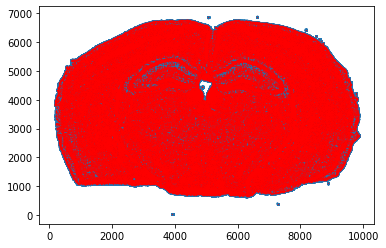

In [26]:
plt.scatter(reads_assigned['x_location'],reads_assigned['y_location'],s=1)
plt.scatter(cells_metadata['x_centroid'],cells_metadata['y_centroid'],s=0.1,color='red')

In [27]:
dist2=(reads_assigned['x_location']-reads_assigned['x_cell'])**2+(reads_assigned['y_location']-reads_assigned['y_cell'])**2
reads_assigned['distance']=np.sqrt(dist2)
reads_assigned['distance']=reads_assigned['distance'].round(0)

# Calculate from celltype signatures to domains

In [29]:
background_express=pd.crosstab(reads_not_assigned['domain'],reads_not_assigned['feature_name'])

  0%|                                                                                            | 0/50 [00:00<?, ?it/s]

L2/3 IT CTX Glut


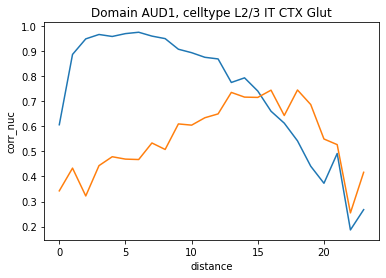

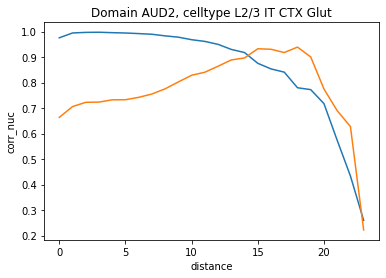

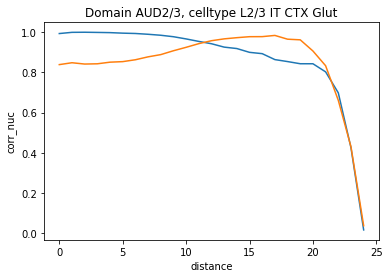

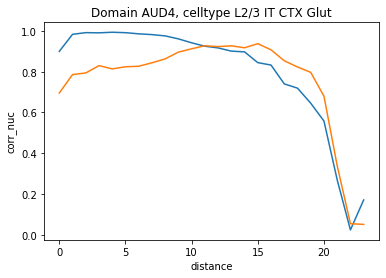

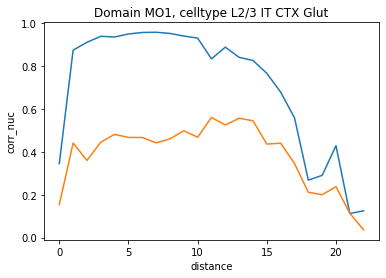

...

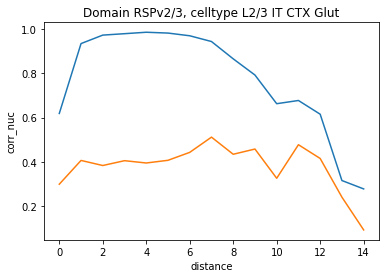

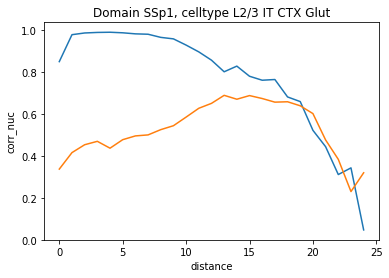

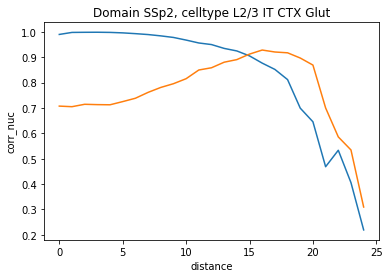

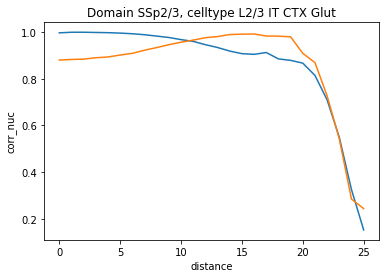

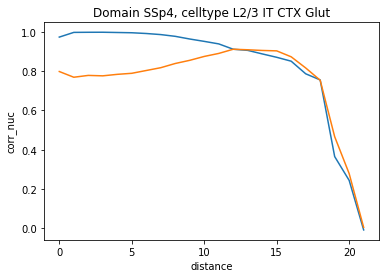

  2%|█▋                                                                                  | 1/50 [00:50<40:56, 50.13s/it]

L2/3 IT RSP Glut


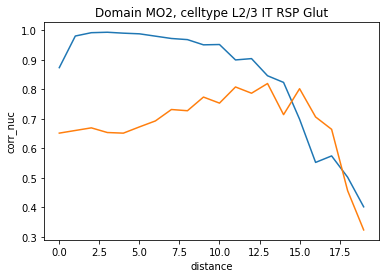

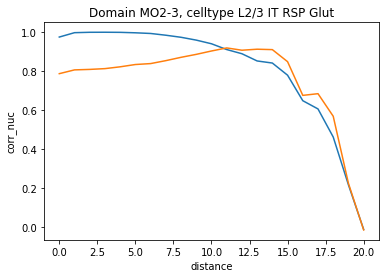

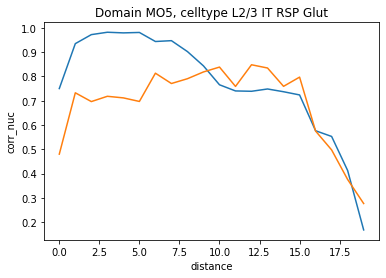

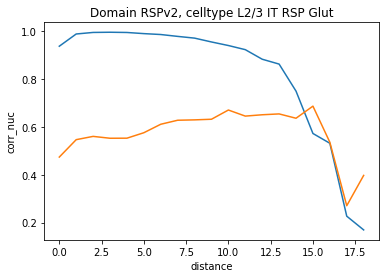

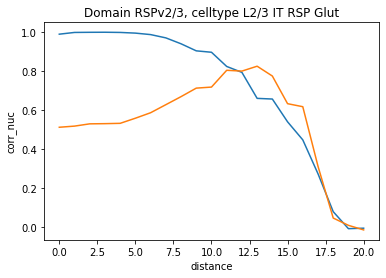

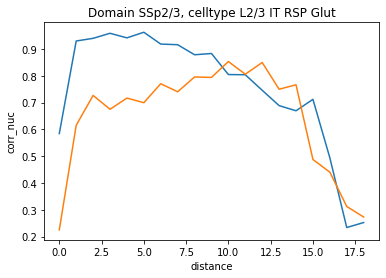

  4%|███▎                                                                                | 2/50 [00:59<20:41, 25.87s/it]

L5/6 IT CTX Glut


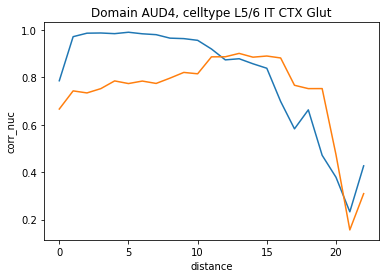

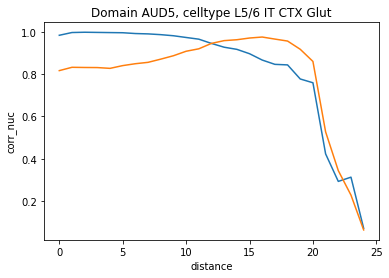

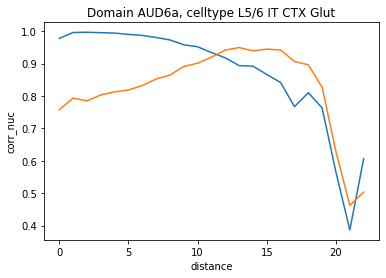

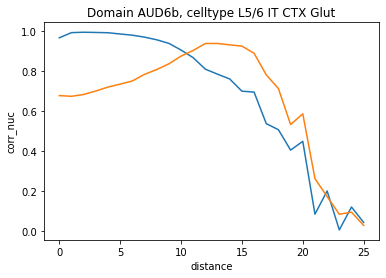

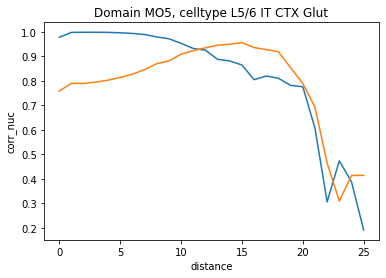

...

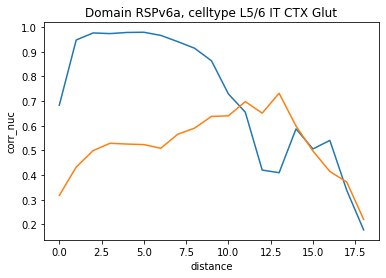

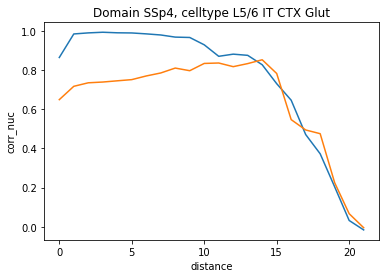

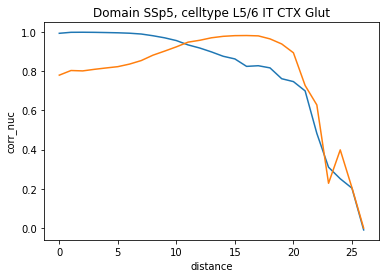

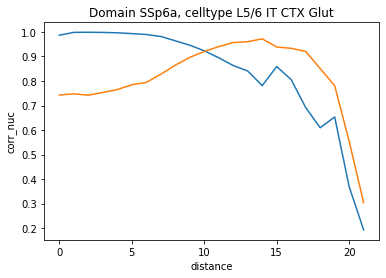

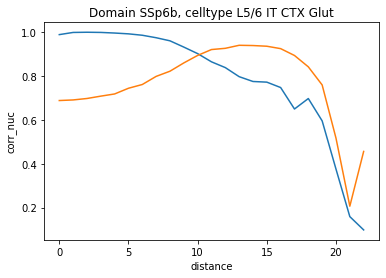

  6%|█████                                                                               | 3/50 [01:24<20:14, 25.85s/it]

VLMC


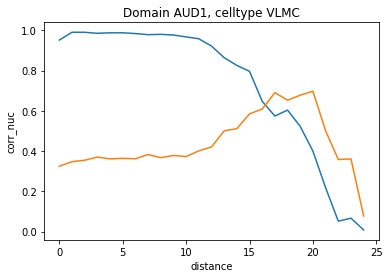

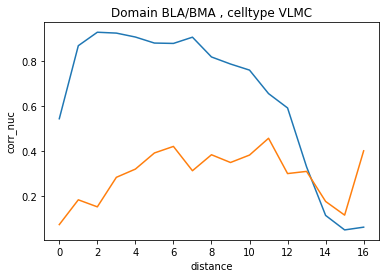

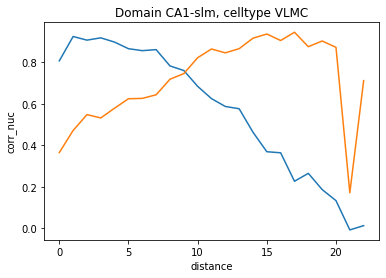

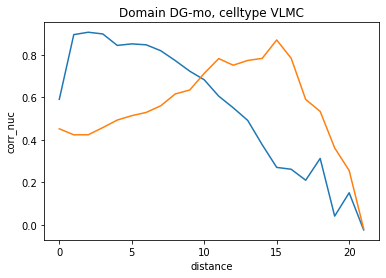

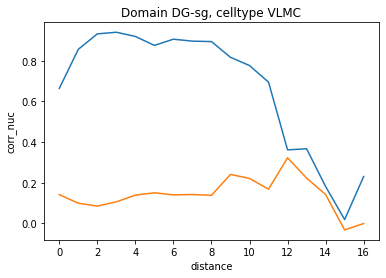

...

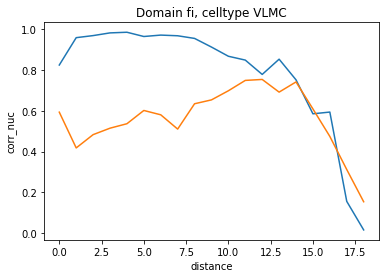

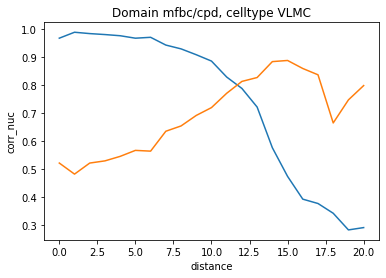

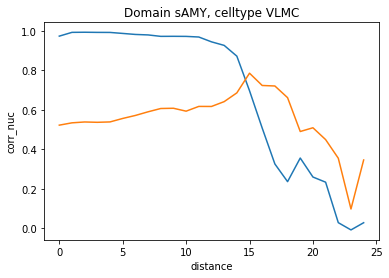

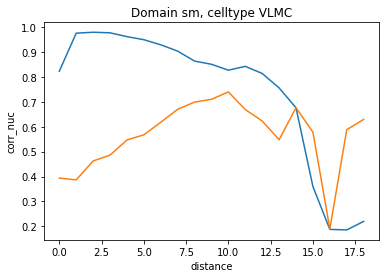

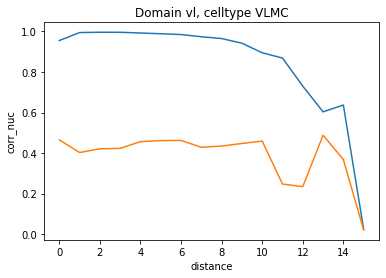

  8%|██████▋                                                                             | 4/50 [01:52<20:23, 26.60s/it]




Endothelial cells


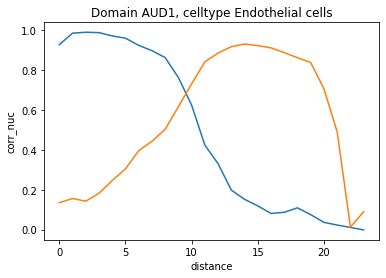

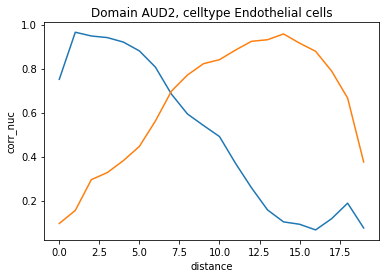

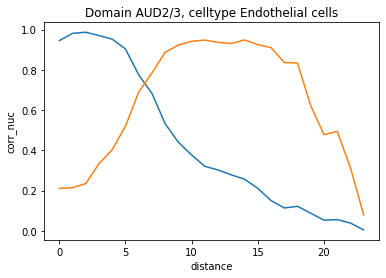

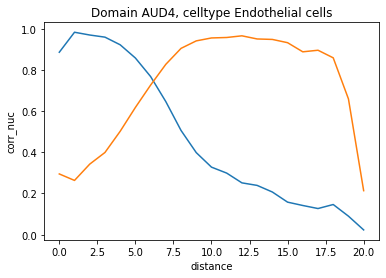

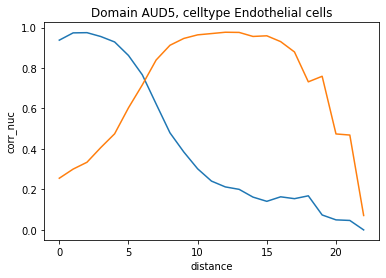

...

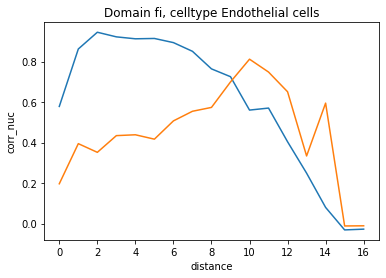

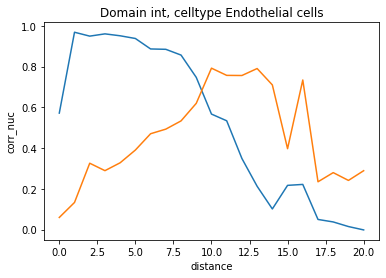

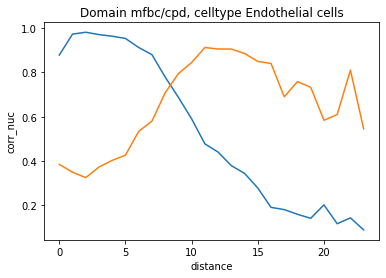

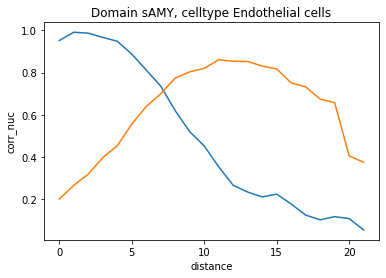

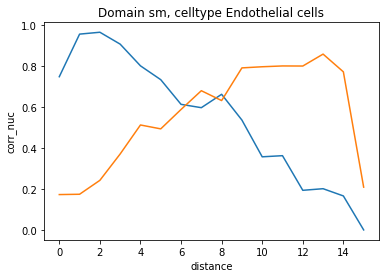

 10%|████████▍                                                                           | 5/50 [02:55<29:41, 39.60s/it]

Microglia


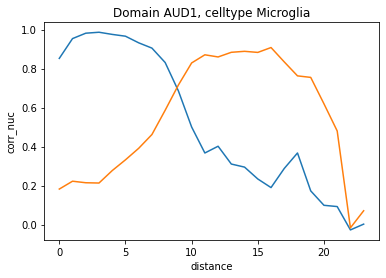

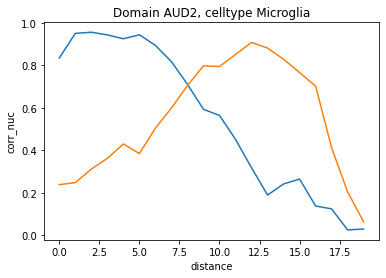

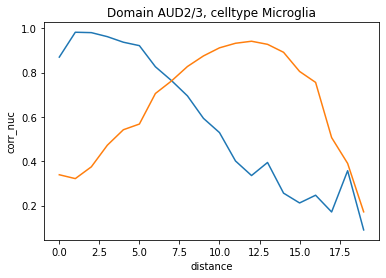

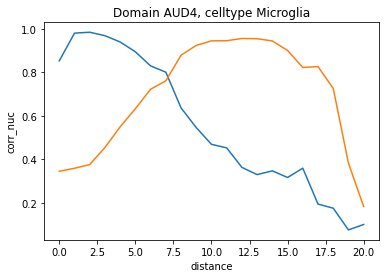

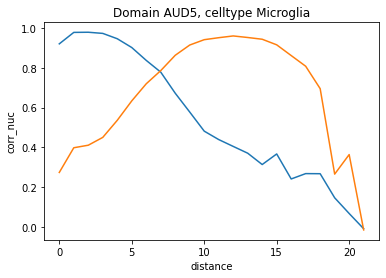

...

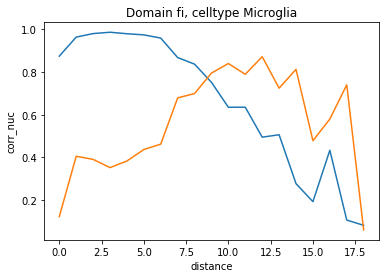

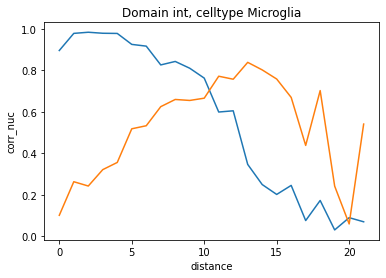

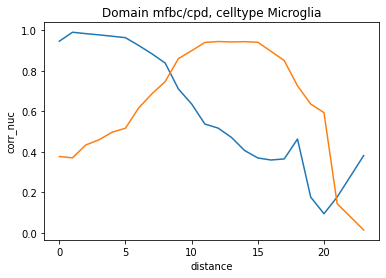

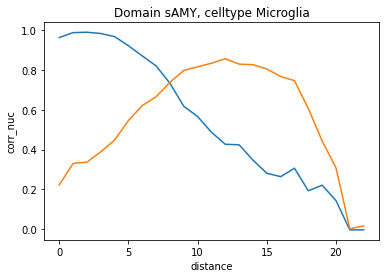

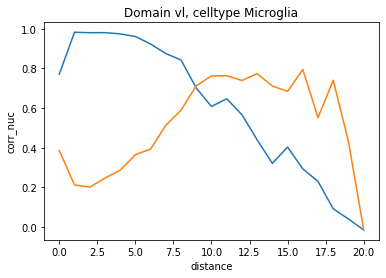

 12%|██████████                                                                          | 6/50 [03:35<29:14, 39.86s/it]


Oligodendrocytes


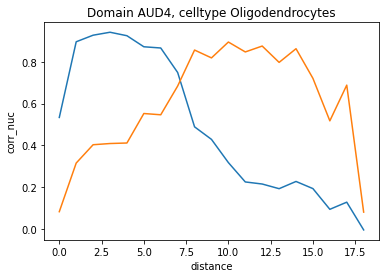

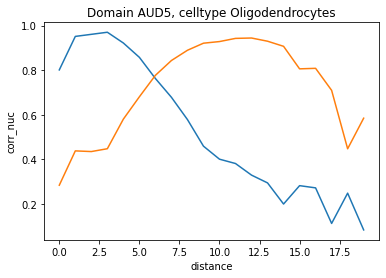

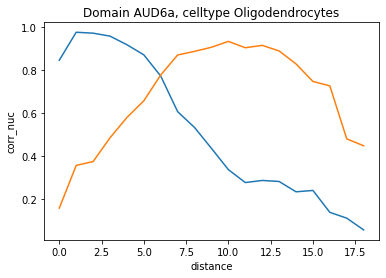

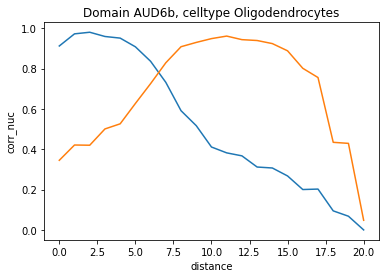

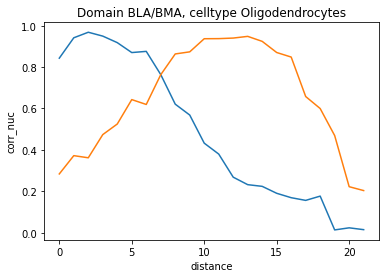

...

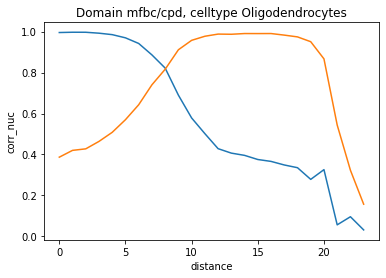

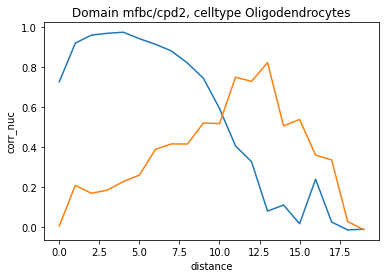

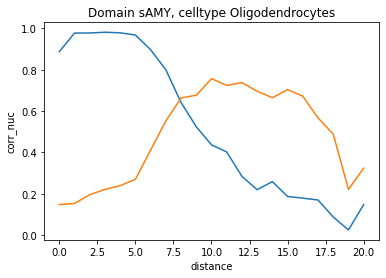

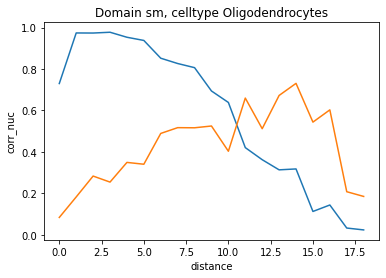

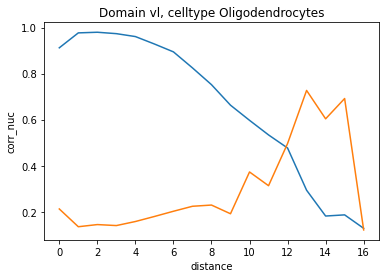

 14%|███████████▊                                                                        | 7/50 [04:45<35:40, 49.78s/it]



Pvalb Gaba


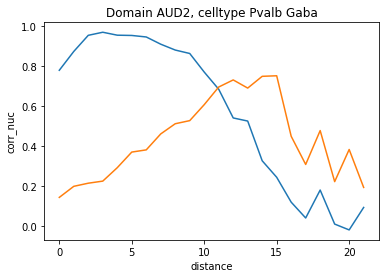

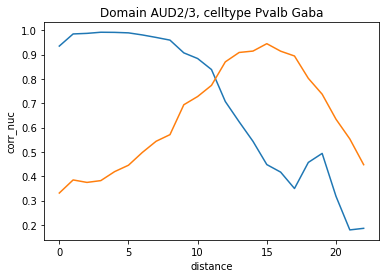

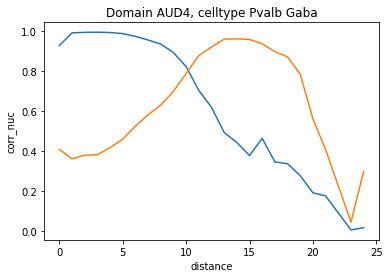

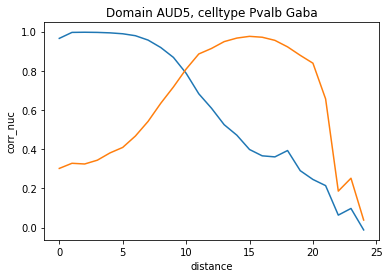

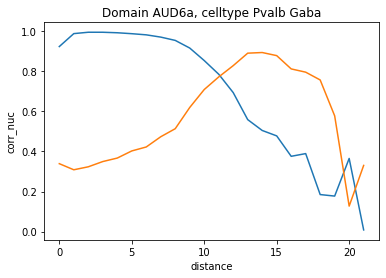

...

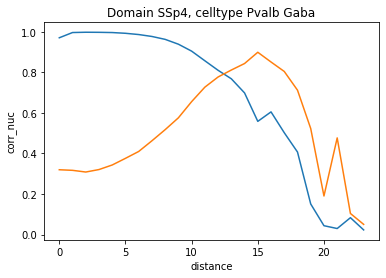

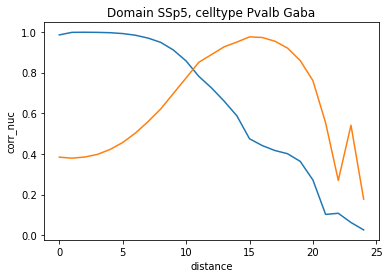

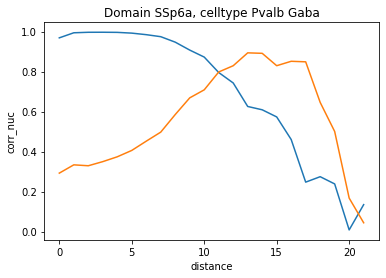

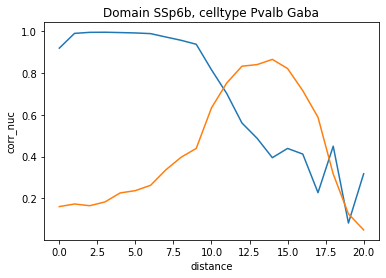

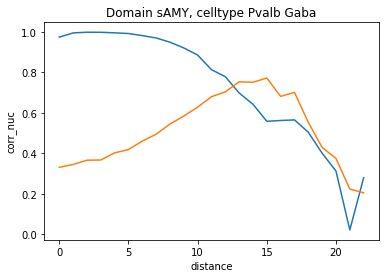

 16%|█████████████▍                                                                      | 8/50 [05:20<31:31, 45.03s/it]

L5 ET CTX Glut


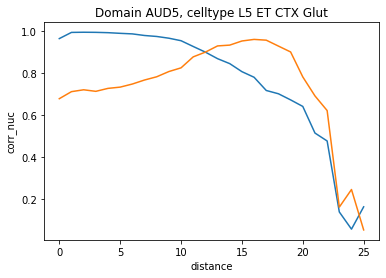

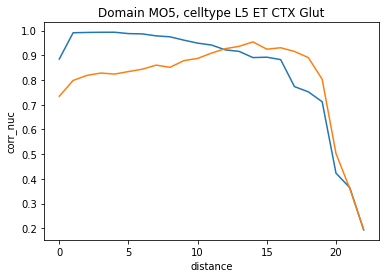

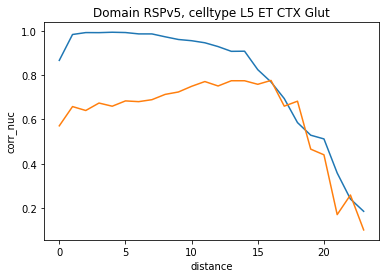

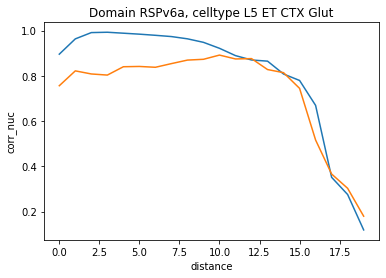

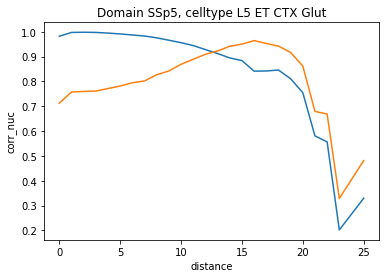

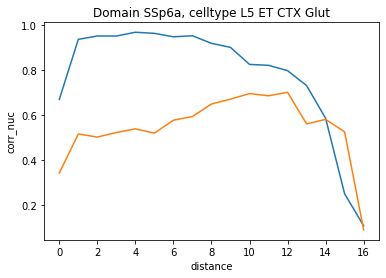

 18%|███████████████                                                                     | 9/50 [05:30<23:12, 33.97s/it]

Astrocytes


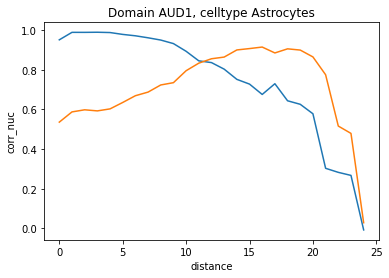

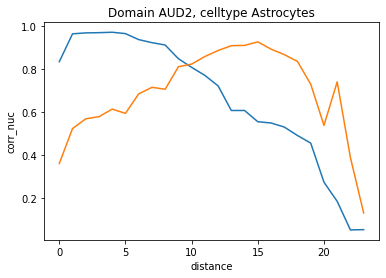

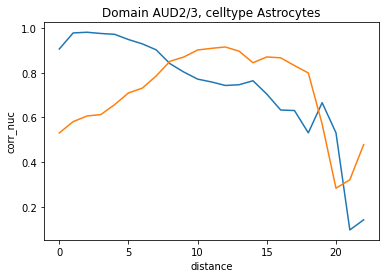

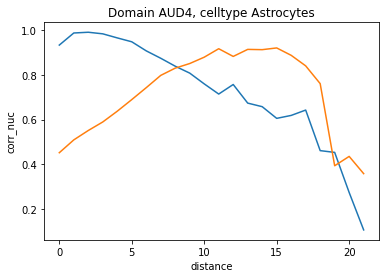

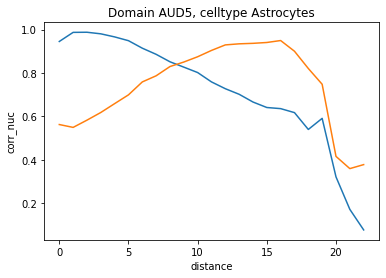

...

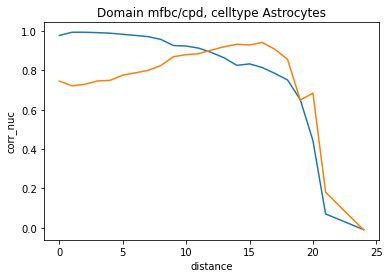

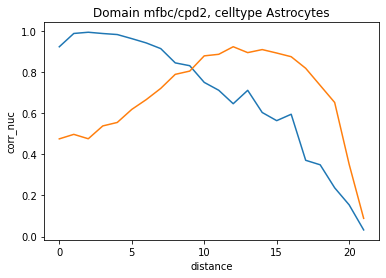

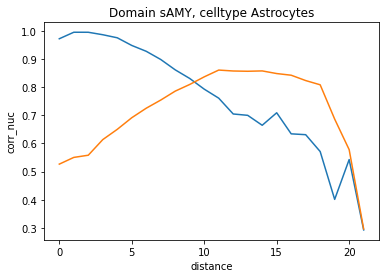

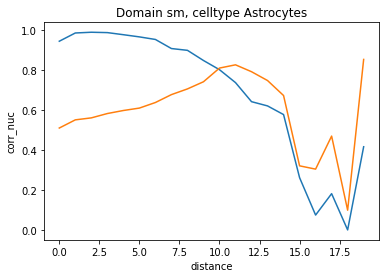

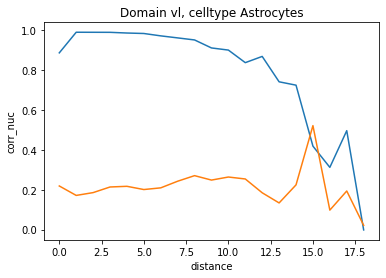

 20%|████████████████▌                                                                  | 10/50 [06:58<33:44, 50.62s/it]

Inh. Gaba Mixed 2


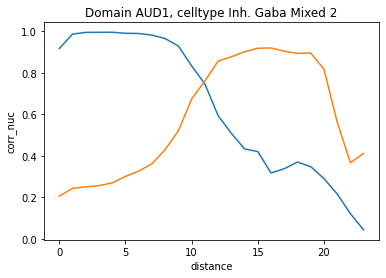

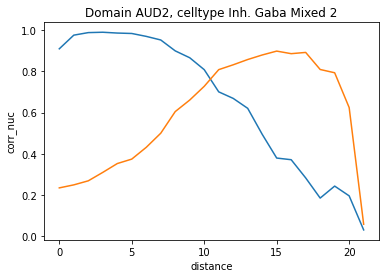

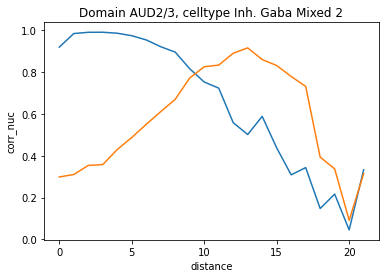

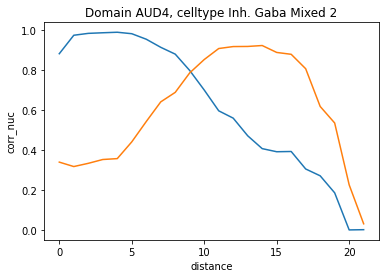

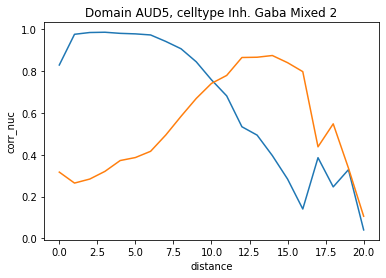

...

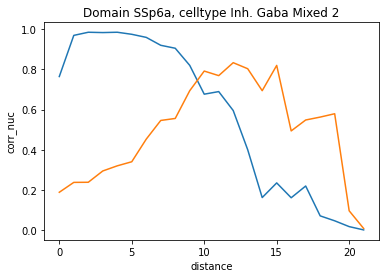

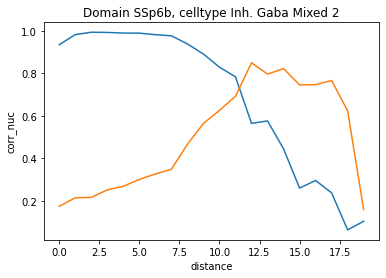

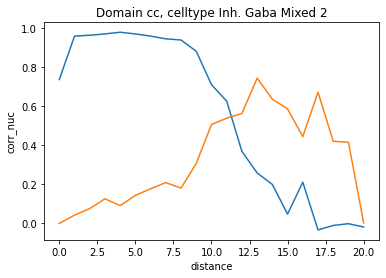

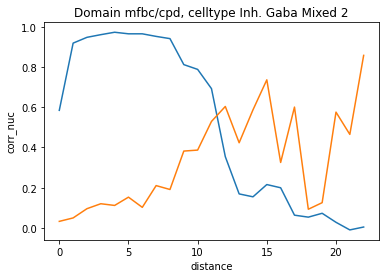

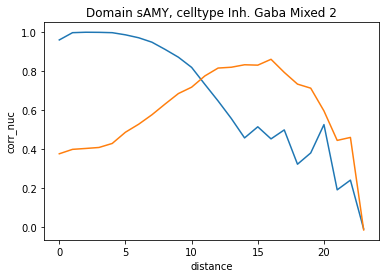

 22%|██████████████████▎                                                                | 11/50 [07:31<29:25, 45.27s/it]

Missegmented Oligo


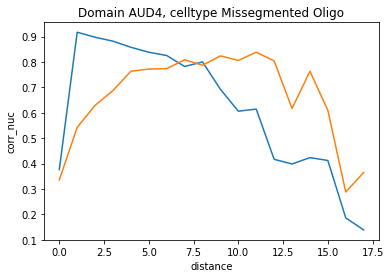

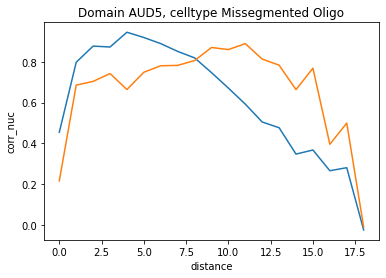

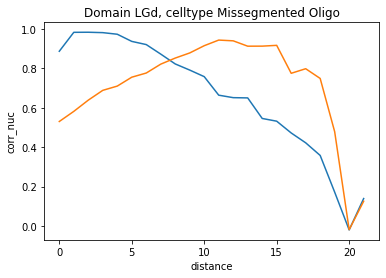

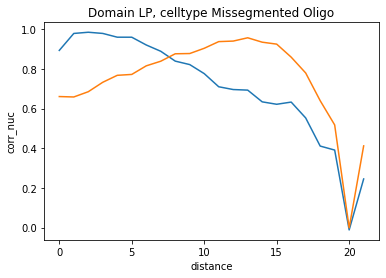

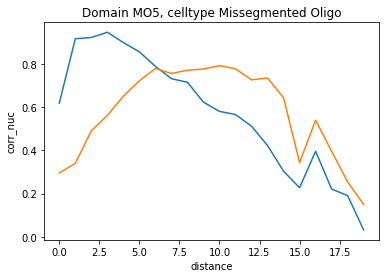

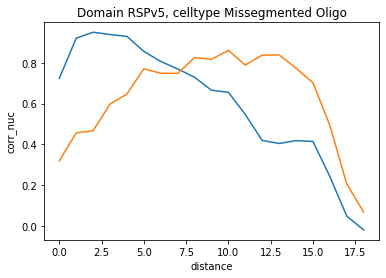

In [ ]:
#define the output variables
turnover_summ=pd.DataFrame(columns=reads_assigned['initial_annotation'].unique(),index=reads_assigned['domain'].unique())
meand_celltype=[]
nuclimall=[]
cellmall=[]
#start the loop where, for 
for CELLTYPE in tqdm(reads_assigned['initial_annotation'].unique()):
    print(CELLTYPE)
    reads_assignedsub=reads_assigned[reads_assigned['initial_annotation']==CELLTYPE]
    good_domains=reads_assignedsub.groupby('domain').count()[reads_assignedsub.groupby('domain').count().iloc[:,1]>5000].index
    tdistanceall=[]
    nuclim=[]
    cellm=[]
    for dom in good_domains:
        reads_ctd=reads_assignedsub[reads_assignedsub['domain']==dom]
        expression_distances=pd.crosstab(reads_ctd['distance'],reads_ctd['feature_name'])
        reads_ctd_nucl=pd.crosstab(reads_ctd['overlaps_nucleus'],reads_ctd['feature_name'])
        reads_ctd_nucl=reads_ctd_nucl.loc[:,reads_ctd_nucl.columns.isin(background_express.columns)]
        reads_ctd_nucl=reads_ctd_nucl.sort_values(by='feature_name', axis=1)
        bck_sub=background_express.loc[:,background_express.columns.isin(reads_ctd_nucl.columns)]
        bck_sub=bck_sub.sort_values(by='feature_name', axis=1)
        expression_distances=expression_distances.loc[:,expression_distances.columns.isin(reads_ctd_nucl.columns)]
        expression_distances=expression_distances.sort_values(by='feature_name', axis=1)
        corr_nuc=[]
        corr_bck=[]
        for dist in expression_distances.index:
            corr_bck.append(np.corrcoef(expression_distances.loc[dist,:],bck_sub.loc[dom,:])[0,1])
            corr_nuc.append(np.corrcoef(expression_distances.loc[dist,:],reads_ctd_nucl.loc[1,:])[0,1])
        summary=pd.DataFrame([corr_nuc,corr_bck],columns=expression_distances.index,index=['corr_nuc','corr_back']).transpose()
        summary['corr_nuc']=summary['corr_nuc'].astype(float)
        summary['diff']=summary['corr_nuc']-summary['corr_back']
        import matplotlib
        matplotlib.rcParams['pdf.fonttype'] = 42
        matplotlib.rcParams['ps.fonttype'] = 42
        plt.figure()
        sns.lineplot(data=summary,x='distance',y='corr_nuc')
        sns.lineplot(data=summary,x='distance',y='corr_back')
        plt.title('Domain '+str(dom)+', celltype ' + str(CELLTYPE))
        plt.savefig('../../figures/celltype_identification_multisection/crossover_point/'+str(dom.replace('/','_'))+'_'+str(CELLTYPE.replace('/','_'))+'.pdf')
        plt.show()
        try:
            tdistance=np.min(summary.loc[summary['diff']<0.1,:].index)
        except:
            tdistance=np.max(summary.index)
        if str(np.min(summary.loc[summary['diff']<0.1,:].index))=='nan':
            tdistance=np.max(summary.index)
        turnover_summ.loc[dom,CELLTYPE]=tdistance
        tdistanceall.append(tdistance)
        reads_ctdsub=reads_ctd[reads_ctd['overlaps_nucleus']==1]
        cellm.append(dist_nuc(reads_ctd))
        nuclim.append(dist_nuc(reads_ctdsub))
    meand_celltype.append(np.mean(tdistanceall))
    nuclimall.append(np.mean(nuclim))
    cellmall.append(np.mean(cellm))

We define the mean optimal expansion form the centroid as:

In [68]:
np.nanmean(meand_celltype)

10.711346545391898

Since the mean nuclei distance is 

In [69]:
np.nanmean(nuclimall)

5.063725388643133

Then, the optimal expansion, from the nuclei border, will be:

In [70]:
np.nanmean(meand_celltype)-np.nanmean(nuclimall)

5.647621156748765

In [72]:
turnover_x_celltype=pd.DataFrame([meand_celltype,nuclimall,cellmall],columns=reads_assigned['initial_annotation'].unique(),index=['turnover','nuclei_size','cell_size'])
turnover_x_celltype=turnover_x_celltype.fillna(0).transpose()
turnover_x_celltype=turnover_x_celltype.sort_values(by='turnover')
coldict=dict(zip(np.unique(adata1.obs['Class']),adata1.uns['Class_colors']))
turnover_x_celltype['colors']=turnover_x_celltype.index.map(coldict)
tf=turnover_x_celltype.iloc[1:,:]

# Plot the optimal expansion as in the manuscript

In [77]:
reg_mean=[]
#del tball
for ind in turnover_summ.columns:
    reg_mean.append(np.mean(turnover_summ.loc[:,ind]))
    tb=pd.DataFrame(turnover_summ.loc[:,ind])
    tb.columns=['to']
    tb['ct']=ind
    tb.reset_index()
    try:
        tball=pd.concat([tball,tb],axis=0)
    except:
        tball=tb
tf['cluster']=tf.index
tball.columns=['score','cluster']
tfmerge=tball.merge(on='cluster',right=tf)
tfmerge=tfmerge.sort_values(by='turnover')

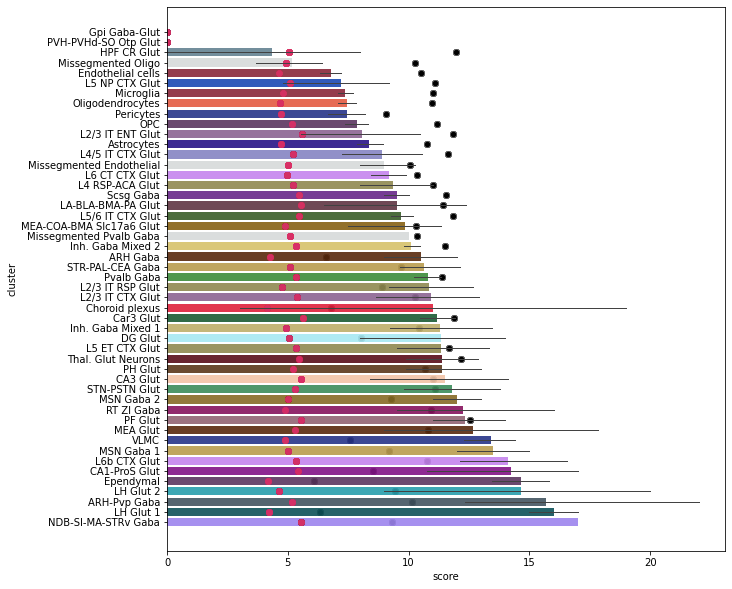

In [79]:
plt.figure(figsize=(10,10))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.scatterplot(data=tfmerge,y=tfmerge.cluster,x='cell_size',edgecolor='gray',color='black')
plt.setp(ax.patches, linewidth=1)
sns.barplot(data=tfmerge,y=tfmerge.cluster,x='score',palette=tf.colors,alpha=0.9,errwidth=1)
sns.scatterplot(data=tfmerge,y=tfmerge.cluster,x='nuclei_size',color='#D83066',edgecolor=None,alpha=0.2)
plt.savefig('../../figures/celltype_identification_multisection/nuclei_vs_background_0_crossover.pdf')

# We now plot only a subset of the clusters
Specifically, we plot the ones that have scores computed on more than 5 domains.

In [80]:
tfmerge_sel=tfmerge.groupby('cluster').count()['score'][tfmerge.groupby('cluster').count()['score']>5].index
tfmergesub=tfmerge[tfmerge['cluster'].isin(tfmerge_sel)]
tfsub=tf[tf.index.isin(tfmerge_sel)]

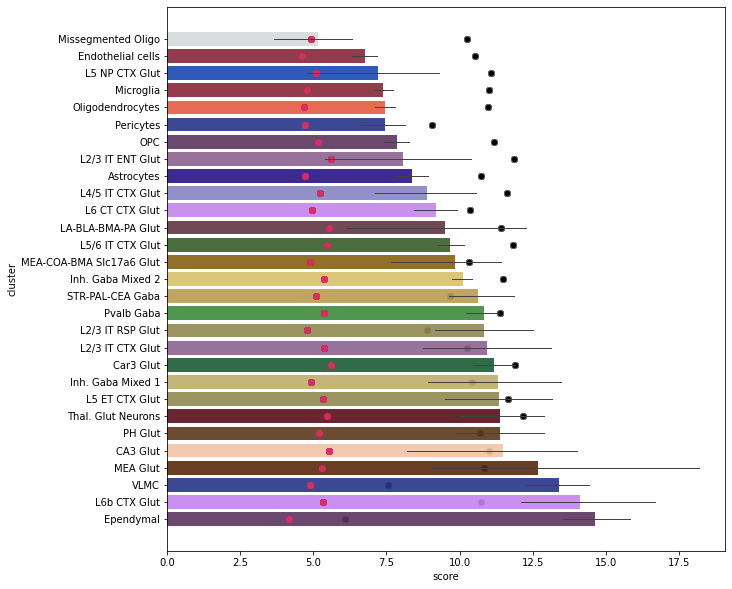

In [81]:
plt.figure(figsize=(10,10))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.scatterplot(data=tfmergesub,y=tfmergesub.cluster,x='cell_size',edgecolor='gray',color='black')
plt.setp(ax.patches, linewidth=1)
sns.barplot(data=tfmergesub,y=tfmergesub.cluster,x='score',palette=tfsub.colors,alpha=0.9,errwidth=1)
sns.scatterplot(data=tfmergesub,y=tfmergesub.cluster,x='nuclei_size',color='#D83066',edgecolor=None,alpha=0.2)
plt.savefig('../../figures/celltype_identification_multisection/nuclei_vs_background_0_crossover_subset_5domains_min.pdf')